# AON First Level Model

Author: Olaf Borghi olafborghi@gmail.com

## Prepare Setup

### Define fixed parameters, load libraries/modules

In [1]:
# Import necessary packages and modules
%matplotlib inline
# libraries
import os
import numpy as np
import nibabel as nib
import pandas as pd
import nilearn as nl
from matplotlib import pyplot as plt
# specific modules
from nipype import Node, Workflow
from nipype.interfaces import fsl
from nilearn.glm.first_level import FirstLevelModel
from nilearn import plotting, datasets, image
from nilearn.datasets import load_mni152_template
from pathlib import Path
from pprint import pprint
from glob import glob

/usr/local/lib/python3.8/dist-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


In [2]:
# fixed folders
basedir = Path("/home/olafb99/mnt/p/userdata/olafb99/shared/03_AON_ACTION")
outputdir = Path(basedir / "derivatives")
datadir = Path(basedir / "01_data")

# first level output dir
if not os.path.exists(outputdir / "first_level"):
    os.makedirs(outputdir / "first_level")
first_level_dir = outputdir / "first_level"

if not os.path.exists(first_level_dir / "AON-task"):
    os.makedirs(first_level_dir / "AON-task")
AON_first_level_dir = first_level_dir / "AON-task"

**Import some self created helper functions**

The python script should be stored in the same folder

In [3]:
# I defined a number of functions that help me to import the data files from all subjects in a python script
import flm_helper_functions as flm_helpers
# let's look at the documentation of one of the functions
?flm_helpers.MyMRIImages

Signature: flm_helpers.MyMRIImages(paths)
Docstring:
Returns a dictionary with the functional or anatomical MRI images of each subject
loaded as a nib.img
Inputs: A list of paths to the functional/anatomical images, ordered by subject number
File:      ~/mnt/p/userdata/olafb99/shared/03_AON_ACTION/02_scripts/flm_helper_functions.py
Type:      function


### Load the warped anatomical and the preprocessed functional images

In [4]:
# store the paths of the warped anatomical images of all subjects in a list and load them using the function
anat_paths = sorted(glob(f"{outputdir}/*/AON_run-01.feat/reg/highres2standard.nii.gz"))
anat_dict = flm_helpers.MyMRIImages(anat_paths)

# store the paths of the preprocessed functional image files and masks of all subjects of AON_run-01 in a list and load them using the function
AON_run_01_paths = sorted(glob(f"{outputdir}/*/AON_run-01.feat/preprocessed_func_data_MNI.nii.gz"))
AON_run_01_dict = flm_helpers.MyMRIImages(AON_run_01_paths)

# store the paths of the preprocessed functional image files of all subjects of AON_run-02 in a list and load them using the function
AON_run_02_paths = sorted(glob(f"{outputdir}/*/AON_run-02.feat/preprocessed_func_data_MNI.nii.gz"))
AON_run_02_dict = flm_helpers.MyMRIImages(AON_run_02_paths)

# load the MNI template
template = load_mni152_template(resolution=1)

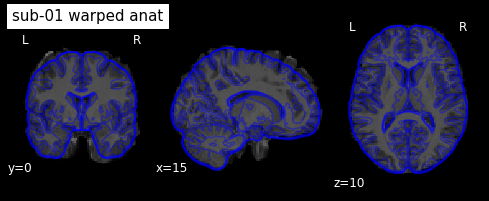

In [5]:
# sanity check - plot the warped anat a sbj
sbj = "sub-01"

anat_img = plotting.plot_anat(anat_dict.get(sbj), title = f"{sbj} warped anat", 
                   draw_cross = False, black_bg = True, cut_coords = (15, 0, 10))
anat_img.add_contours(template, filled=False, alpha=0.4, colors="b")

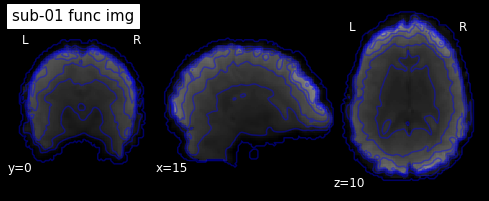

In [6]:
# sanity check - overlay the preprocessed func files of AON of sub-01 of both runs

sbj = "sub-01"

func_img_mean_run1 = image.mean_img(AON_run_01_dict.get(sbj))
func_img_mean_run2 = image.mean_img(AON_run_02_dict.get(sbj))

func_img = plotting.plot_anat(func_img_mean_run1, title = f"{sbj} func img", 
                   draw_cross = False, black_bg = True, cut_coords = (15, 0, 10))
func_img.add_contours(func_img_mean_run2, filled=False, alpha=0.4, colors="b")

# they are both in the same space

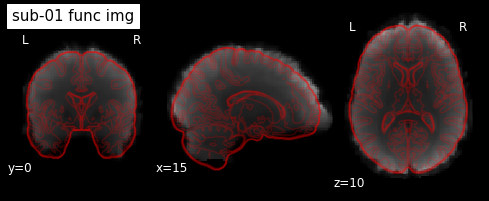

In [7]:
# sanity check - overlay the func file with the MNI template to check if its in the right space
func_img = plotting.plot_anat(func_img_mean_run1, title = f"{sbj} func img", 
                   draw_cross = False, black_bg = True, cut_coords = (15, 0, 10))
func_img.add_contours(template, filled=False, alpha=0.2, colors="r")

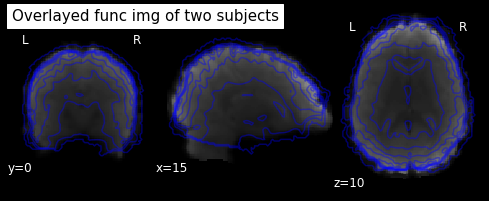

In [8]:
# sanity check - plot the preprocessed func files of AON run 1 of different subjects 

func_img_mean_sub1 = image.mean_img(AON_run_01_dict.get("sub-01"))
func_img_mean_sub2 = image.mean_img(AON_run_01_dict.get("sub-02"))

func_img = plotting.plot_anat(func_img_mean_sub1, title = f"Overlayed func img of two subjects", 
                   draw_cross = False, black_bg = True, cut_coords = (15, 0, 10))
func_img.add_contours(func_img_mean_sub2, filled=False, alpha=0.4, colors="b")

# they are both in the same space

**All safety checks looks good, everything is in the right space!!**

### Load the realignment parameters and framewise displacement confounds

In [9]:
# store paths of AON_run-01 realignment parameters in a list and use the function to load the motion parameters of AON_run-01
AON_run_01_pars_path = sorted(glob(f"{outputdir}/*/AON_run-01.feat/mc/prefiltered_func_data_mcf.par"))
AON_run_01_fd_path = sorted(glob(f"{outputdir}/*/AON_run-01.feat/motion_assess/confound.txt"))
AON_run_01_pars_dict = flm_helpers.MyMotionParameters(AON_run_01_pars_path, AON_run_01_fd_path)

Percentage of volums with fd > 0.9 of subject 1 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 2 =  FD    6.934307
dtype: float64
Percentage of volums with fd > 0.9 of subject 3 =  FD    0.3663
dtype: float64
Percentage of volums with fd > 0.9 of subject 4 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 5 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 6 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 7 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 8 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 9 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 10 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 11 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 12 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 13 =  FD    0.0
dtype: float64


In [10]:
# store paths of AON_run-02 realignment parameters in a list and use the function to load the motion parameters of AON_run-02
AON_run_02_pars_path = sorted(glob(f"{outputdir}/*/AON_run-02.feat/mc/prefiltered_func_data_mcf.par"))
AON_run_02_fd_path = sorted(glob(f"{outputdir}/*/AON_run-02.feat/motion_assess/confound.txt"))
AON_run_02_pars_dict = flm_helpers.MyMotionParameters(AON_run_02_pars_path, AON_run_02_fd_path)

Percentage of volums with fd > 0.9 of subject 1 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 2 =  FD    6.985294
dtype: float64
Percentage of volums with fd > 0.9 of subject 3 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 4 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 5 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 6 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 7 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 8 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 9 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 10 =  FD    0.367647
dtype: float64
Percentage of volums with fd > 0.9 of subject 11 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 12 =  FD    0.0
dtype: float64
Percentage of volums with fd > 0.9 of subject 13 =  FD    0.0
dtype: float6

### Load the events.tsv files

In [11]:
# load paths of AON_run-01 event files in a list and use the function to store them in a dict
AON_run_01_events_path = sorted(glob(f"{datadir}/*/func/*_task-AON_run-01_events.tsv"))
AON_run_01_events_dict = flm_helpers.MyEventFiles(AON_run_01_events_path)

# load paths of AON_run-02 event files in a list and use the function to store them in a dict
AON_run_02_events_path = sorted(glob(f"{datadir}/*/func/*_task-AON_run-02_events.tsv"))
AON_run_02_events_dict = flm_helpers.MyEventFiles(AON_run_02_events_path)

In [12]:
# sanity check - inspect events.tsv file of a subject of AON run 01
sbj = "sub-01"
events_aon_run_01 = AON_run_01_events_dict.get(sbj)
# display shape of events file
print(events_aon_run_01.shape)
# display 5 first and last values of each column
events_aon_run_01.head(5)

(18, 12)


,onset,duration,offset,condition,trial_type,participant_id,date,session,attempt,run,dur_fixation,task_duration
0,5.044104,14.957332,20.001436,8,Human Scrambled,sub-01,2020-09-24-13-05-19,1,1,1,5,324.932103
1,25.036297,12.431768,37.468065,1,Dog Goal-directed,sub-01,2020-09-24-13-05-19,1,1,1,3,324.932103
2,40.503415,12.715053,53.218468,5,Dog Ghost,sub-01,2020-09-24-13-05-19,1,1,1,4,324.932103
3,57.252661,12.649943,69.902604,3,Dog Miming,sub-01,2020-09-24-13-05-19,1,1,1,5,324.932103
4,74.934853,12.816701,87.751554,7,Dog Scrambled,sub-01,2020-09-24-13-05-19,1,1,1,6,324.932103


Now everything should be set and ready to fit the first level model! :)

## First level model of AON of subject 1

In [13]:
sbj = "sub-01"

# I used the TR from the experiment, and for all other params I used the default values
first_level = FirstLevelModel(t_r=1.2,
                              hrf_model="spm",
                              drift_model="cosine",
                              slice_time_ref=0, # slice time correction was already applied
                              high_pass=1/128, 
                              minimize_memory = False, # for voxelwise attributes like R-Squared
                              verbose=True) 

In [14]:
# fit AON first level model of sub-01
first_level_fit = first_level.fit((AON_run_01_dict.get(sbj),AON_run_02_dict.get(sbj)), 
                                  events = (AON_run_01_events_dict.get(sbj),AON_run_02_events_dict.get(sbj)),
                                  confounds = (AON_run_01_pars_dict.get(sbj), AON_run_02_pars_dict.get(sbj)))

Computing run 1 out of 2 runs (go take a coffee, a big one)
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `date` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `task_duration` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `offset` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/experimental_paradigm.py:89: UserWarning: Unexpected column `session` in events data will be ignored.
  warnings.warn(("Unexpected column `{}` in events "
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/exp

(273, 21)
(271, 21)


Text(0.5, 1.0, 'AON run 02 design matrix')

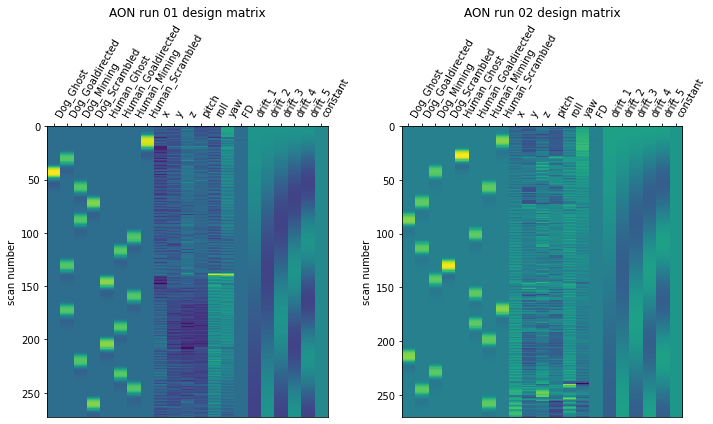

In [15]:
# we choose the design matrices of run-01 and run-02 
X1 = first_level_fit.design_matrices_[0]
X2 = first_level_fit.design_matrices_[1]

# print the shape of the design matrix
print(np.shape(X1))
print(np.shape(X2))

# plot the design matrix
from nilearn.plotting import plot_design_matrix
fig, (ax1, ax2) = plt.subplots(figsize=(10, 6), nrows=1, ncols=2)
plot_design_matrix(X1, ax=ax1)
ax1.set_title('AON run 01 design matrix', fontsize=12)
plot_design_matrix(X2, ax=ax2)
ax2.set_title('AON run 02 design matrix', fontsize=12)

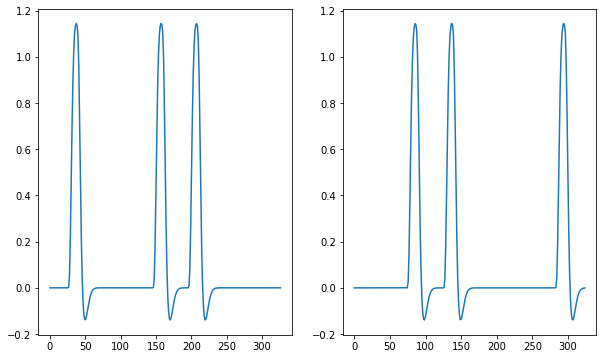

In [16]:
# plot an exemplary HRF
fig, axes = plt.subplots(figsize=(10, 6), nrows=1, ncols=2)
axes[0].plot(X1["Dog_Goaldirected"])
axes[1].plot(X2["Dog_Goaldirected"])

#### Looks good, let's calculate and plot the contrasts 

**Safety checks:**

1. Main conditions > Baseline
2. Motion parameters > Baseline

**Contrasts for ROI & whole brain analysis**

3. dog_transitive-baseline
4. dog_intransitive-baseline
5. human_transitive-baseline
6. human_intransitive-baseline
7. transitive-intransitive
8. intransitive-transitive
9. dog-human
10. human-dog
11. dog_transitive-intransitive
12. dog_intransitive-transitive
13. human_transitive-intransitive
14. human_intransitive-transitive

**Interaction contrasts**

15. transitivity x species
16. transitivity x specied reversed

**Whole brain control contrasts**

17. ghost - baseline
18. scrambled - baseline
19. all action - ghost
20. all action - scrambled

**Additional control condition contrasts**

21. dog_ghost - human_ghost
22. human_ghost - dog_ghost
23. dog_scrambled - baseline
24. human_scrambled - baseline
25. dog_scrambled - human_scrambled
26. human_scrambled - dog_scrambled

In [23]:
n_columns = first_level_fit.design_matrices_[0].shape[1]

# setup contrast dictonary for AON 
contrasts = {
    "main-baseline": flm_helpers.pad_vector([0, 1, 1, 0, 0, 1, 1], n_columns),
    "motion-baseline": flm_helpers.pad_vector([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1], n_columns),
    "dog_transitive-baseline": flm_helpers.pad_vector([0, 1], n_columns),
    "dog_intransitive-baseline": flm_helpers.pad_vector([0, 0, 1], n_columns),
    "human_transitive-baseline": flm_helpers.pad_vector([0, 0, 0, 0, 0, 1], n_columns),
    "human_intransitive-baseline": flm_helpers.pad_vector([0, 0, 0, 0, 0, 0, 1], n_columns),
    "transitive-intransitive": flm_helpers.pad_vector([0, 1, -1, 0, 0, 1, -1], n_columns),
    "intransitive-transitive": flm_helpers.pad_vector([0, -1, 1, 0, 0, -1, 1], n_columns),
    "dog-human": flm_helpers.pad_vector([0, 1, 1, 0, -1, -1], n_columns),
    "human-dog": flm_helpers.pad_vector([0, -1, -1, 0, 1, 1], n_columns),
    "dog_transitive-intransitive": flm_helpers.pad_vector([0, 1, -1], n_columns),
    "dog_intransitive-transitive": flm_helpers.pad_vector([0, -1, 1], n_columns),
    "human_transitive-intransitive": flm_helpers.pad_vector([0, 0, 0, 0, 0, 1, -1], n_columns),
    "human_intransitive-transitive": flm_helpers.pad_vector([0, 0, 0, 0, 0, -1, 1], n_columns), 
    "interaction_action-agent": flm_helpers.pad_vector([0, -1, 1, 0, 0, 1, -1], n_columns),
    "reversed_interaction_action-agent": flm_helpers.pad_vector([0, 1, -1, 0, 0, -1, 1], n_columns),
    "ghost-baseline": flm_helpers.pad_vector([1, 0, 0, 0, 1], n_columns),
    "scrambled-baseline": flm_helpers.pad_vector([0, 0, 0, 1, 0, 0, 0, 1], n_columns),
    "action-ghost": flm_helpers.pad_vector([-2, 1, 1, 0, -2, 1, 1], n_columns),
    "action-scrambled": flm_helpers.pad_vector([0, 1, 1, -2, 0, 1, 1, -2], n_columns),
    "dog_ghost-human_ghost": flm_helpers.pad_vector([1, 0, 0, 0, -1], n_columns),
    "human_ghost-dog_ghost": flm_helpers.pad_vector([-1, 0, 0, 0, 1], n_columns),
    "dog_scrambled-baseline": flm_helpers.pad_vector([0, 0, 0, 1], n_columns),
    "human_scrambled-baseline": flm_helpers.pad_vector([0, 0, 0, 0, 0, 0, 0, 1], n_columns),
    "dog_scrambled-human_scrambled": flm_helpers.pad_vector([0, 0, 0, 1, 0, 0, 0, -1], n_columns),
    "human_scrambled-dog_scrambled": flm_helpers.pad_vector([0, 0, 0, -1, 0, 0, 0, 1], n_columns)
}

/usr/local/lib/python3.8/dist-packages/nilearn/plotting/matrix_plotting.py:351: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(.4 * len(design_column_names),


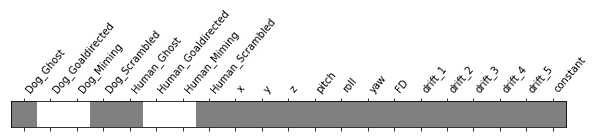

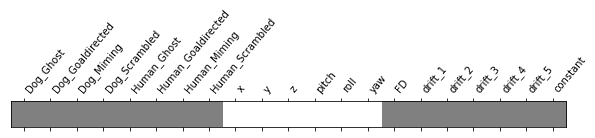

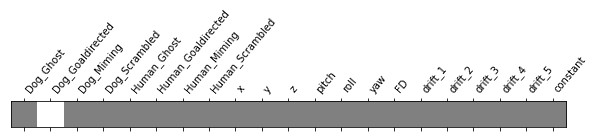

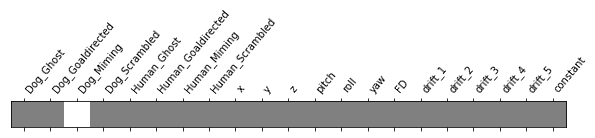

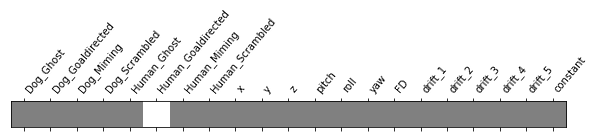

...

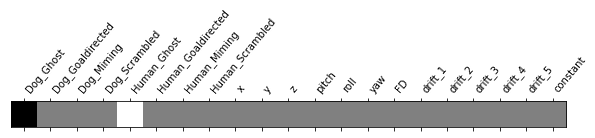

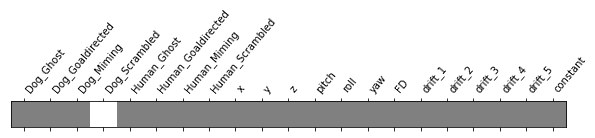

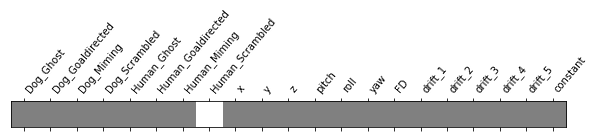

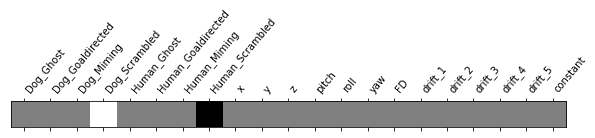

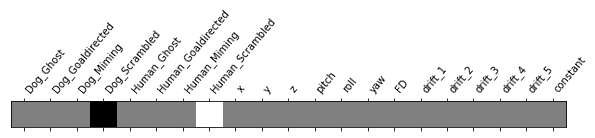

In [24]:
# plot the contrast matrix
for id, val in contrasts.items():
    plotting.plot_contrast_matrix(val, design_matrix=X1)

### Plot the results for one subject

**Across AON Run 1 and AON Run 2**

Arbitrary threshold of 3.

contrast id: main-baseline
contrast val: [0. 1. 1. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/first_level.py:696: UserWarning: One contrast given, assuming it for all 2 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


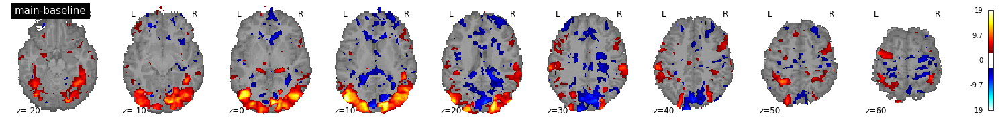

contrast id: motion-baseline
contrast val: [0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0.]


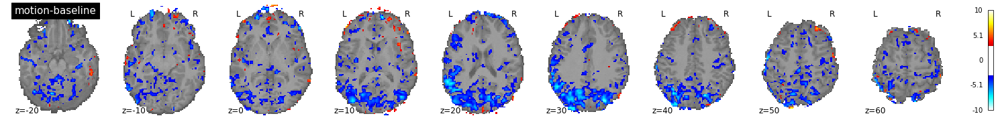

contrast id: dog_transitive-baseline
contrast val: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


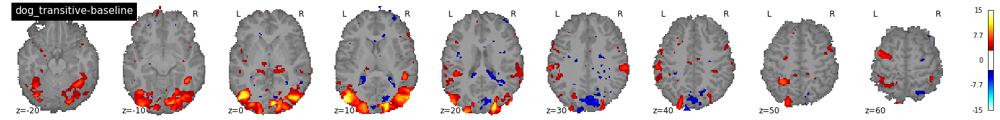

contrast id: dog_intransitive-baseline
contrast val: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


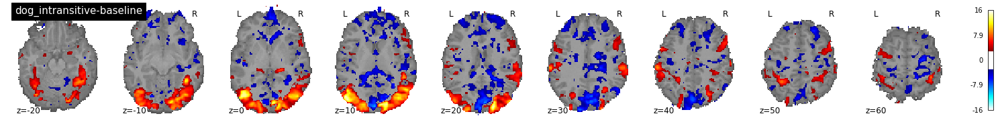

contrast id: human_transitive-baseline
contrast val: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


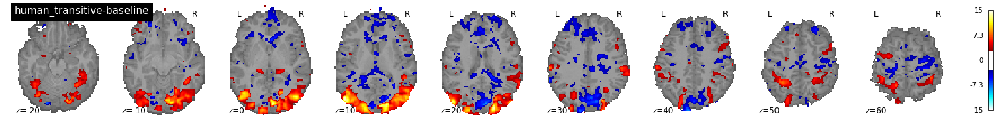

contrast id: human_intransitive-baseline
contrast val: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


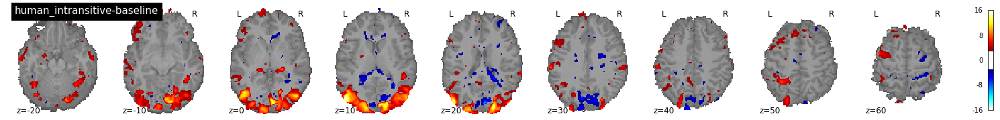

contrast id: transitive-intransitive
contrast val: [ 0.  1. -1.  0.  0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


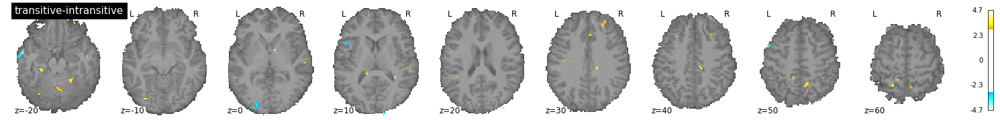

contrast id: intransitive-transitive
contrast val: [ 0. -1.  1.  0.  0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


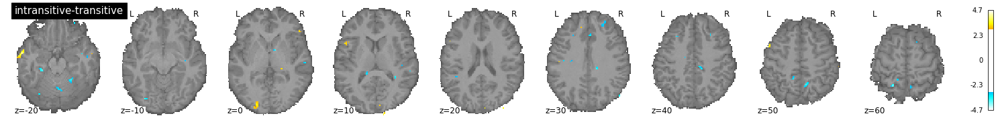

contrast id: dog-human
contrast val: [ 0.  1.  1.  0. -1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


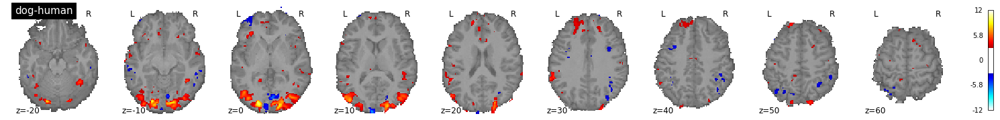

contrast id: human-dog
contrast val: [ 0. -1. -1.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


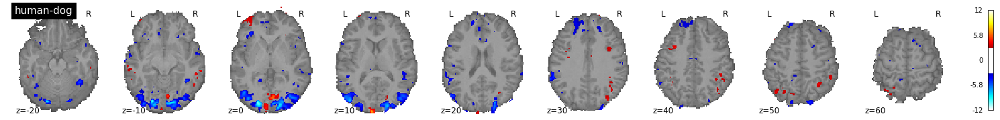

contrast id: dog_transitive-intransitive
contrast val: [ 0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


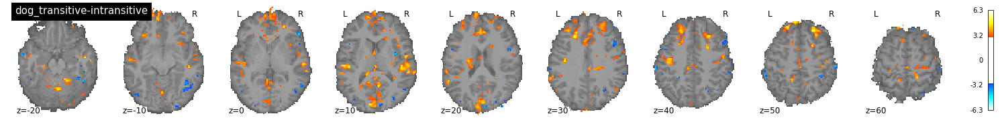

contrast id: dog_intransitive-transitive
contrast val: [ 0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


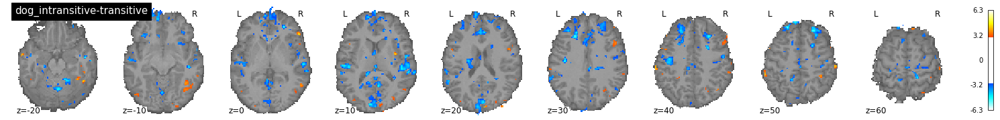

contrast id: human_transitive-intransitive
contrast val: [ 0.  0.  0.  0.  0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


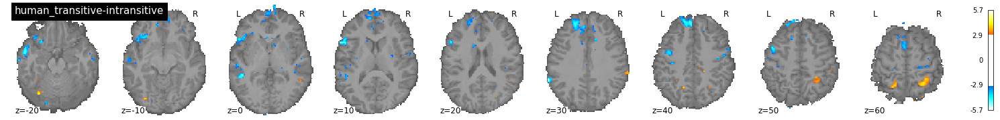

contrast id: human_intransitive-transitive
contrast val: [ 0.  0.  0.  0.  0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


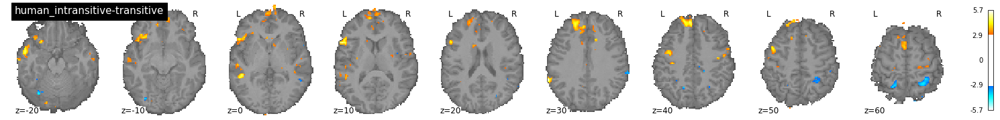

contrast id: interaction_action-agent
contrast val: [ 0. -1.  1.  0.  0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


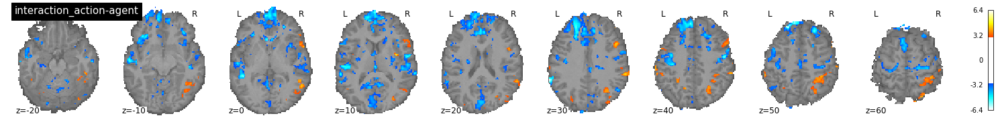

contrast id: reversed_interaction_action-agent
contrast val: [ 0.  1. -1.  0.  0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


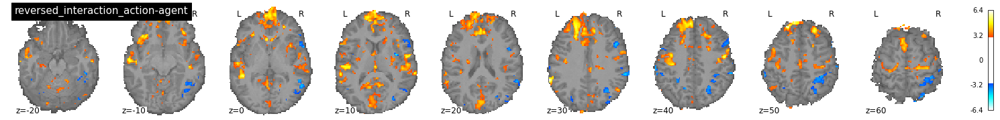

contrast id: ghost-baseline
contrast val: [1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


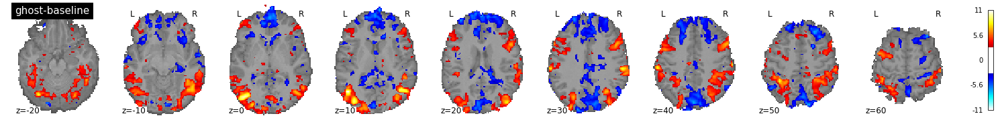

contrast id: scrambled-baseline
contrast val: [0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


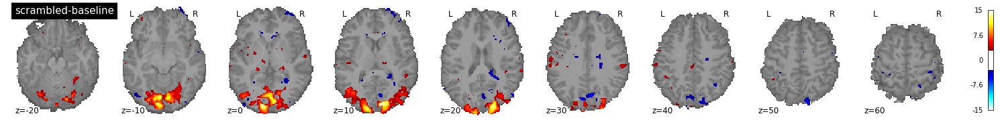

contrast id: action-ghost
contrast val: [-2.  1.  1.  0. -2.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


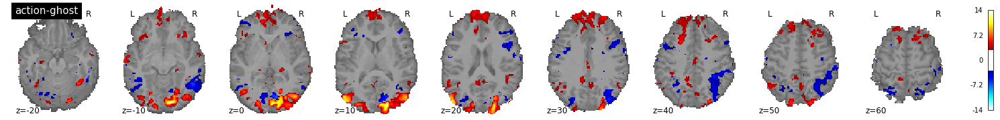

contrast id: action-scrambled
contrast val: [ 0.  1.  1. -2.  0.  1.  1. -2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


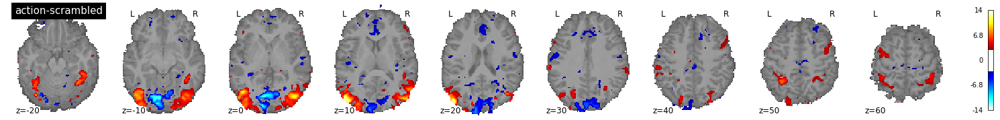

contrast id: dog_ghost-human_ghost
contrast val: [ 1.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


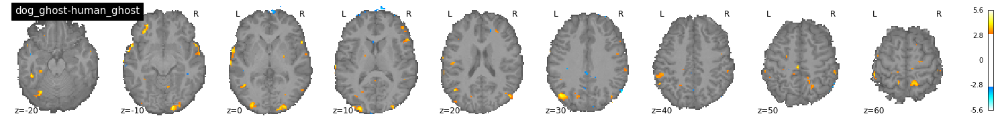

contrast id: human_ghost-dog_ghost
contrast val: [-1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]


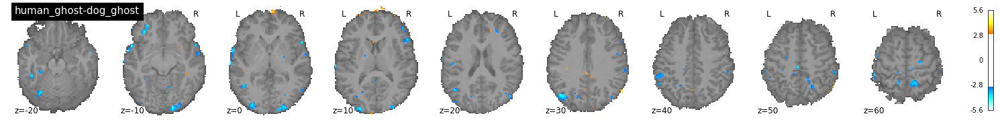

In [19]:
# plotting the contrast maps for each condition

for contrast_id, contrast_val in contrasts.items():
    print(f"contrast id: {contrast_id}")
    print(f"contrast val: {contrast_val}")
    
    # compute the contrasts
    z_map = first_level.compute_contrast(contrast_val, 
                                      output_type='z_score')
    # plot the contrasts 
    # the display is overlaid on the warped anatomical
    
    plotting.plot_stat_map(
        z_map, 
        threshold=3.0, 
        display_mode='z',
        bg_img=anat_dict.get(sbj),
        cut_coords=range(-20, 70, 10), 
        black_bg=False, 
        title=contrast_id,
        symmetric_cbar=True)
    plotting.show()

### First takeaway

The first level model works, and aggregating across the two runs improves the signal to noise ratio.

## Using a loop to fit a first level model for all subjects

So now its time to use a for-loop to compute the first_level model for all 40 subjects for the AON task.

Helpful resources for this:
https://lukas-snoek.com/NI-edu/fMRI-introduction/week_7/nilearn_stats.html#creating-design-matrices


In [22]:
# create a list with all subject ids for indexing
sbj_list = [f"sub-{i:02d}" for i in range(1, 41)]
print(sbj_list)

['sub-01', 'sub-02', 'sub-03', 'sub-04', 'sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-09', 'sub-10', 'sub-11', 'sub-12', 'sub-13', 'sub-14', 'sub-15', 'sub-16', 'sub-17', 'sub-18', 'sub-19', 'sub-20', 'sub-21', 'sub-22', 'sub-23', 'sub-24', 'sub-25', 'sub-26', 'sub-27', 'sub-28', 'sub-29', 'sub-30', 'sub-31', 'sub-32', 'sub-33', 'sub-34', 'sub-35', 'sub-36', 'sub-37', 'sub-38', 'sub-39', 'sub-40']


In [20]:
aon_flm_dict = {} # empty dict to store the first level models
# iterate over subjects
for idx, sbj in enumerate(sbj_list):
    # create First Level Model object
    print(f"Working on first level model of AON of {sbj}")
    flm = FirstLevelModel(t_r=1.2,
                              hrf_model="spm",
                              drift_model="cosine",
                              slice_time_ref=0, # slice time correction was already applied
                              high_pass=1/128, 
                              minimize_memory = False, # for voxelwise attributes like R-Squared
                              n_jobs = 1,
                              verbose=True) 
    # fit first level model
    flm = flm.fit((AON_run_01_dict.get(sbj),AON_run_02_dict.get(sbj)), 
                  events = (AON_run_01_events_dict.get(sbj),AON_run_02_events_dict.get(sbj)),
                  confounds = (AON_run_01_pars_dict.get(sbj), AON_run_02_pars_dict.get(sbj)))
    aon_flm_dict[f"{sbj}"] = flm
aon_flm_dict

Working on first level model of AON of sub-21


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (17 seconds remaining)
/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/first_level.py:64: UserWarning: Mean values of 0 observed.The data have probably been centered.Scaling might not work as expected
  warn('Mean values of 0 observed.'

Computation of 2 runs done in 53 seconds



Working on first level model of AON of sub-22


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 47 seconds



Working on first level model of AON of sub-23


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (20 seconds remaining)

Computation of 2 runs done in 64 seconds



Working on first level model of AON of sub-24


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (15 seconds remaining)

Computation of 2 runs done in 49 seconds



Working on first level model of AON of sub-25


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (18 seconds remaining)

Computation of 2 runs done in 51 seconds



Working on first level model of AON of sub-26


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 51 seconds



Working on first level model of AON of sub-27


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 42 seconds



Working on first level model of AON of sub-28


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (18 seconds remaining)

Computation of 2 runs done in 53 seconds



Working on first level model of AON of sub-29


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (17 seconds remaining)

Computation of 2 runs done in 45 seconds



Working on first level model of AON of sub-30


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (18 seconds remaining)

Computation of 2 runs done in 41 seconds



Working on first level model of AON of sub-31


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (15 seconds remaining)

Computation of 2 runs done in 45 seconds



Working on first level model of AON of sub-32


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (15 seconds remaining)

Computation of 2 runs done in 51 seconds



Working on first level model of AON of sub-33


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (15 seconds remaining)

Computation of 2 runs done in 50 seconds



Working on first level model of AON of sub-34


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (15 seconds remaining)

Computation of 2 runs done in 42 seconds



Working on first level model of AON of sub-35


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 53 seconds



Working on first level model of AON of sub-36


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (17 seconds remaining)

Computation of 2 runs done in 47 seconds



Working on first level model of AON of sub-37


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 44 seconds



Working on first level model of AON of sub-38


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 52 seconds



Working on first level model of AON of sub-39


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (16 seconds remaining)

Computation of 2 runs done in 43 seconds



Working on first level model of AON of sub-40


Computing run 1 out of 2 runs (go take a coffee, a big one)
Computing run 2 out of 2 runs (17 seconds remaining)

Computation of 2 runs done in 52 seconds



{'sub-21': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-22': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-23': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-24': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-25': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-26': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_ref=0, t_r=1.2, verbose=True),
 'sub-27': FirstLevelModel(high_pass=0.0078125, hrf_model='spm', minimize_memory=False,
                 slice_time_re

In [22]:
# create a folder to store the design matrices

if not os.path.exists(AON_first_level_dir / "design_matrices"):
    os.makedirs(AON_first_level_dir / "design_matrices")

# save the design matrices 
    
for i, sbj in enumerate(sbj_list): 
    
    # storage folder
    design_matrix_dir = f"{first_level_dir}/AON-task/design_matrices/{sbj}_AON_design_matrix.png"
    
    # load design matrices
    X1 = aon_flm_dict.get(sbj).design_matrices_[0]
    X2 = aon_flm_dict.get(sbj).design_matrices_[1]
    
    # create a figure and store it 
    fig, (ax1, ax2) = plt.subplots(figsize=(10, 6), nrows=1, ncols=2)
    plot_design_matrix(X1, ax=ax1)
    ax1.set_title('AON run 01 design matrix', fontsize=12)
    plot_design_matrix(X2, ax=ax2)
    ax2.set_title('AON run 02 design matrix', fontsize=12)
    fig.suptitle(sbj)
    fig.savefig(design_matrix_dir)
    plt.close(fig)

Put all the design matrices in a html file --> makes it easier to inspect whether they are correct

In [23]:
%%bash

# put all design matrices in a html file, makes it easier to inspect them later on!
cd /home/olafb99/mnt/p/userdata/olafb99/shared/03_AON_ACTION/derivatives/first_level/AON-task/design_matrices
for file in *.png; do echo "<img src=\"$file\" />" >> AON_design_matrices.html; done

#### Fit the contrasts and store the z-maps

Now we are good to go to fit the contrasts and to store the z-maps of all contrasts of each subject!

 Working on subject: sub-21
  Contrast  1 out of 4: dog_scrambled-dog_baseline


/usr/local/lib/python3.8/dist-packages/nilearn/glm/first_level/first_level.py:696: UserWarning: One contrast given, assuming it for all 2 runs
  warn('One contrast given, assuming it for all %d runs' % n_runs)


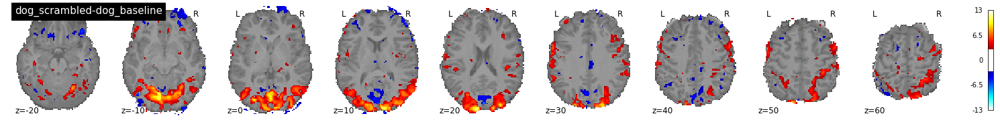

  Contrast  2 out of 4: human_scrambled-human_baseline


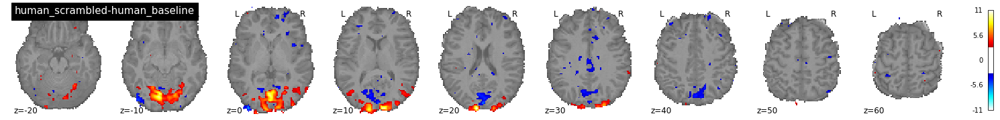

  Contrast  3 out of 4: dog_scrambled-human_scrambled


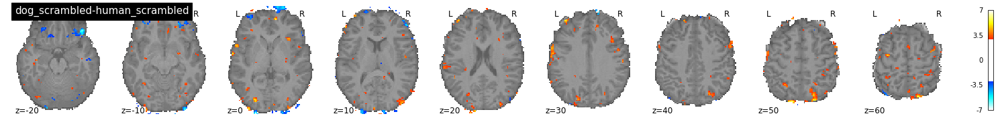

  Contrast  4 out of 4: human_scrambled-dog_scrambled


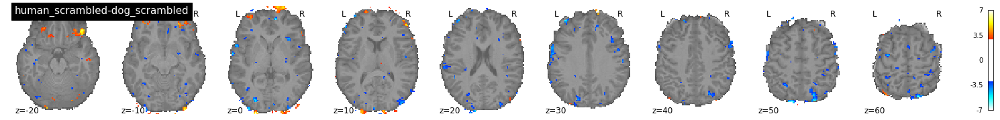

 Working on subject: sub-22
  Contrast  1 out of 4: dog_scrambled-dog_baseline


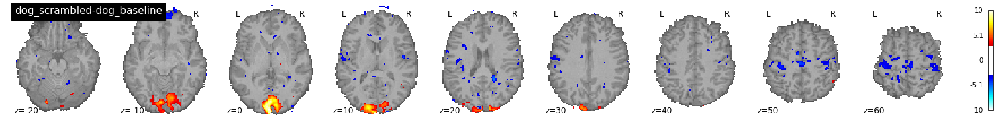

  Contrast  2 out of 4: human_scrambled-human_baseline


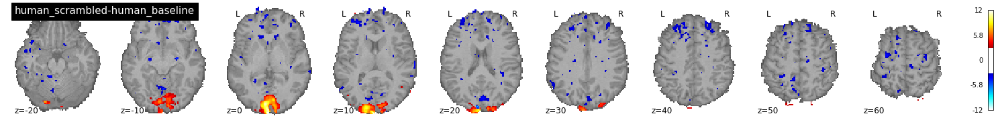

  Contrast  3 out of 4: dog_scrambled-human_scrambled


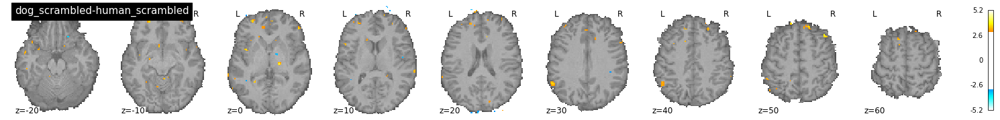

  Contrast  4 out of 4: human_scrambled-dog_scrambled


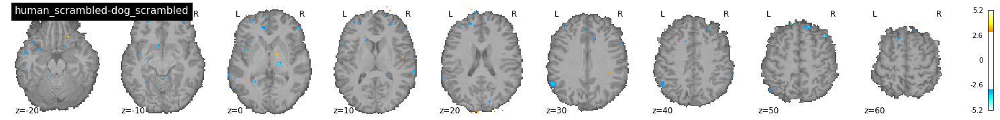

 Working on subject: sub-23
  Contrast  1 out of 4: dog_scrambled-dog_baseline


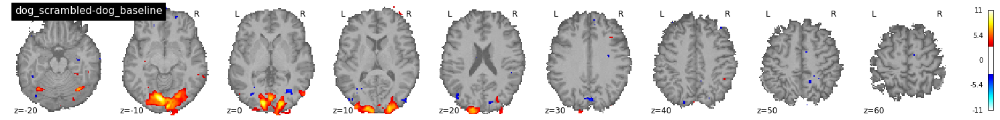

  Contrast  2 out of 4: human_scrambled-human_baseline


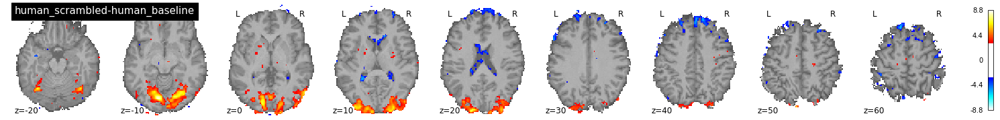

  Contrast  3 out of 4: dog_scrambled-human_scrambled


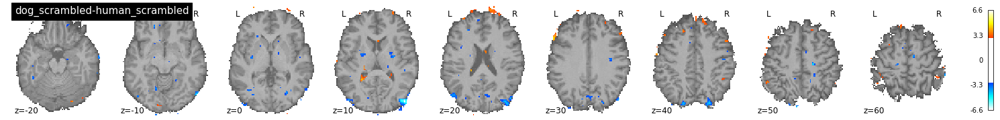

  Contrast  4 out of 4: human_scrambled-dog_scrambled


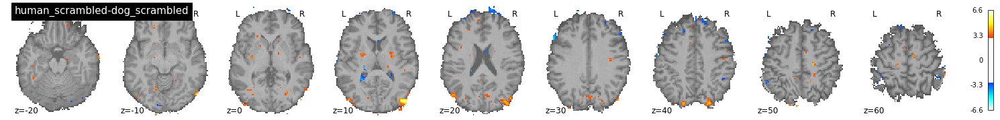

 Working on subject: sub-24
  Contrast  1 out of 4: dog_scrambled-dog_baseline


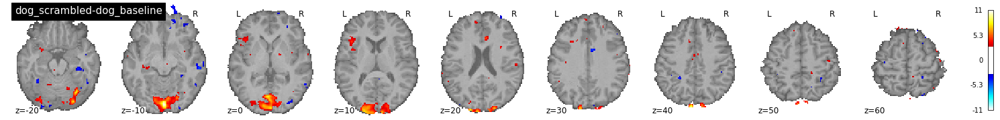

  Contrast  2 out of 4: human_scrambled-human_baseline


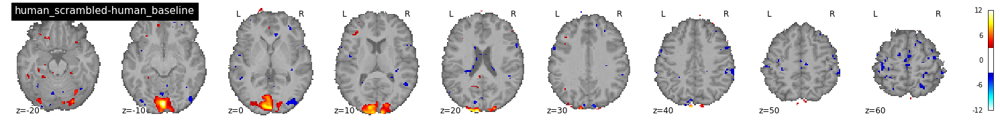

  Contrast  3 out of 4: dog_scrambled-human_scrambled


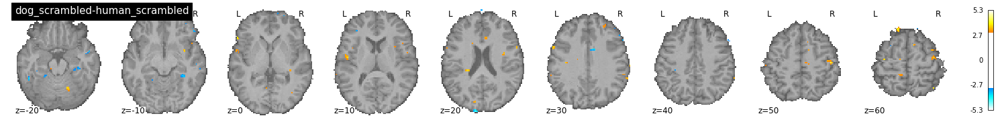

  Contrast  4 out of 4: human_scrambled-dog_scrambled


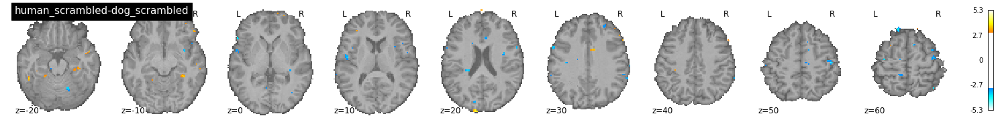

 Working on subject: sub-25
  Contrast  1 out of 4: dog_scrambled-dog_baseline


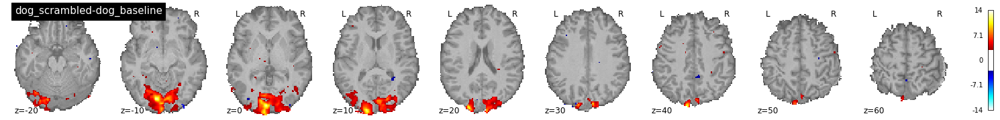

  Contrast  2 out of 4: human_scrambled-human_baseline


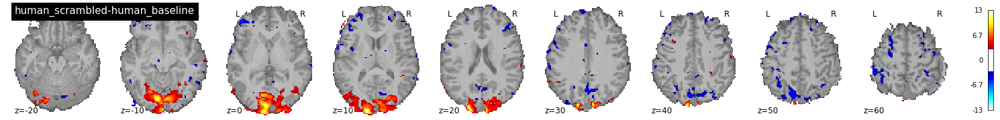

  Contrast  3 out of 4: dog_scrambled-human_scrambled


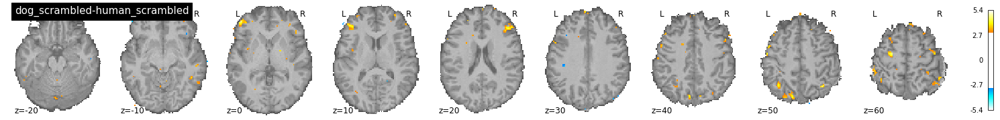

  Contrast  4 out of 4: human_scrambled-dog_scrambled


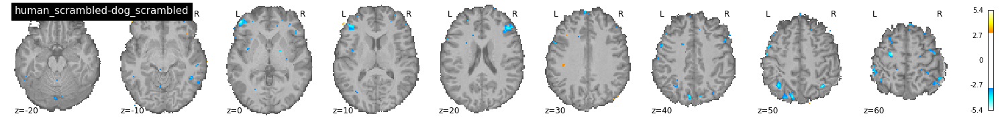

 Working on subject: sub-26
  Contrast  1 out of 4: dog_scrambled-dog_baseline


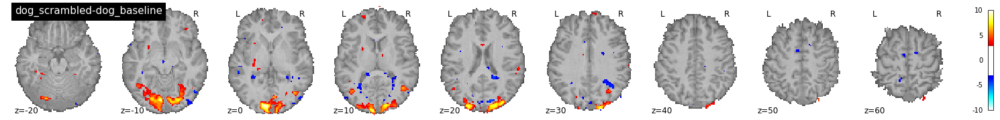

  Contrast  2 out of 4: human_scrambled-human_baseline


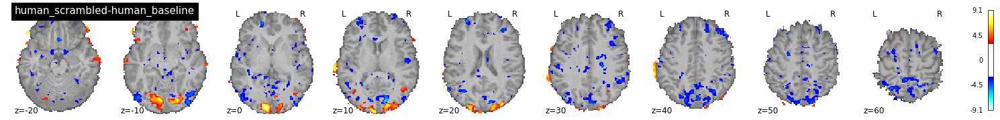

  Contrast  3 out of 4: dog_scrambled-human_scrambled


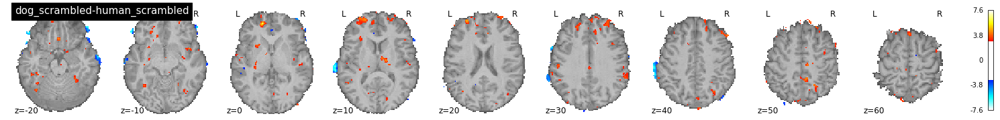

  Contrast  4 out of 4: human_scrambled-dog_scrambled


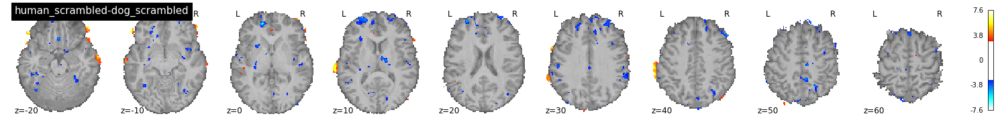

 Working on subject: sub-27
  Contrast  1 out of 4: dog_scrambled-dog_baseline


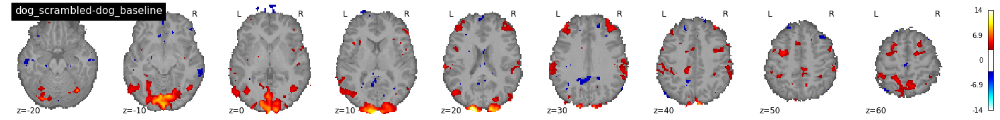

  Contrast  2 out of 4: human_scrambled-human_baseline


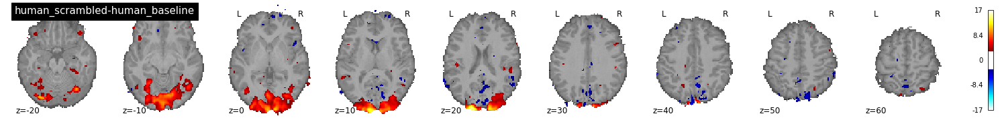

  Contrast  3 out of 4: dog_scrambled-human_scrambled


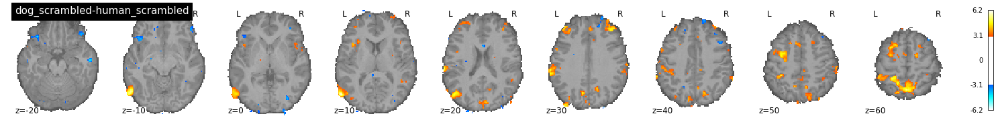

  Contrast  4 out of 4: human_scrambled-dog_scrambled


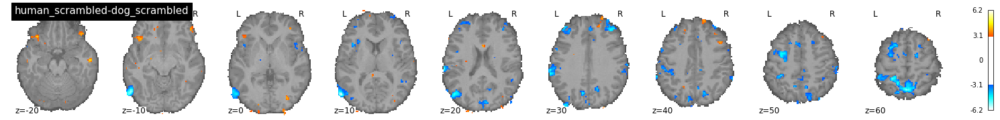

 Working on subject: sub-28
  Contrast  1 out of 4: dog_scrambled-dog_baseline


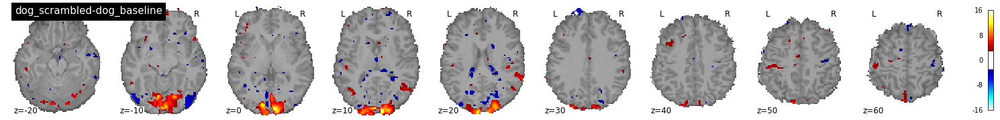

  Contrast  2 out of 4: human_scrambled-human_baseline


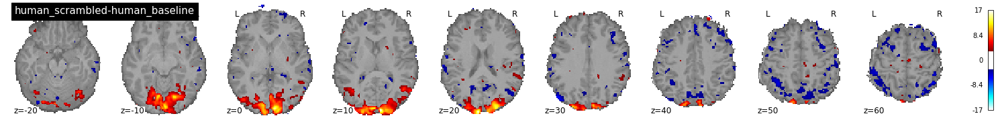

  Contrast  3 out of 4: dog_scrambled-human_scrambled


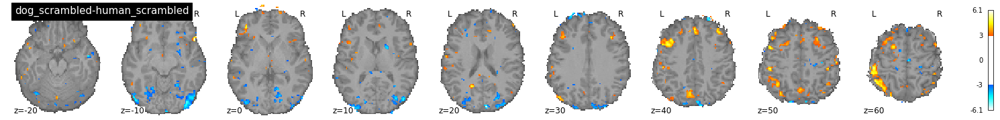

  Contrast  4 out of 4: human_scrambled-dog_scrambled


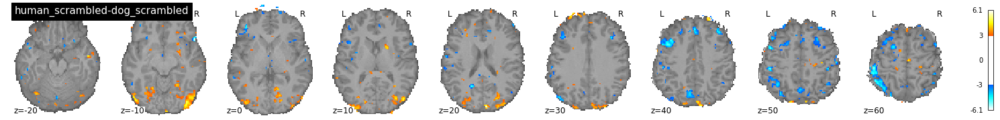

 Working on subject: sub-29
  Contrast  1 out of 4: dog_scrambled-dog_baseline


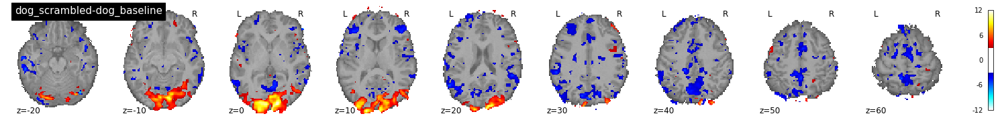

  Contrast  2 out of 4: human_scrambled-human_baseline


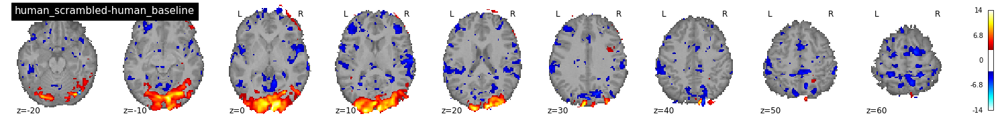

  Contrast  3 out of 4: dog_scrambled-human_scrambled


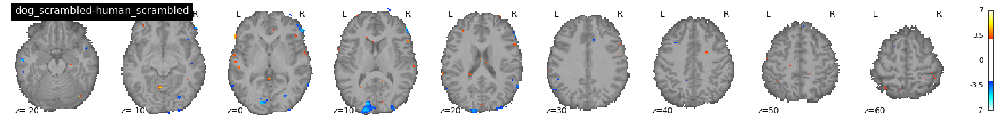

  Contrast  4 out of 4: human_scrambled-dog_scrambled


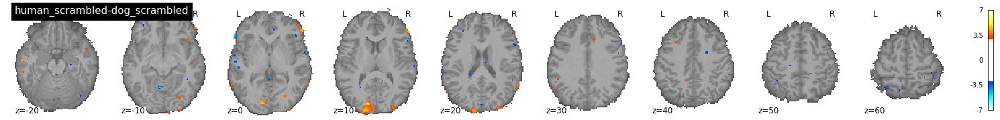

 Working on subject: sub-30
  Contrast  1 out of 4: dog_scrambled-dog_baseline


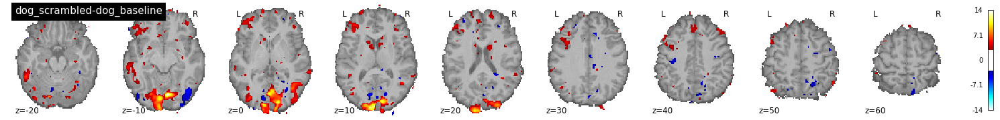

  Contrast  2 out of 4: human_scrambled-human_baseline


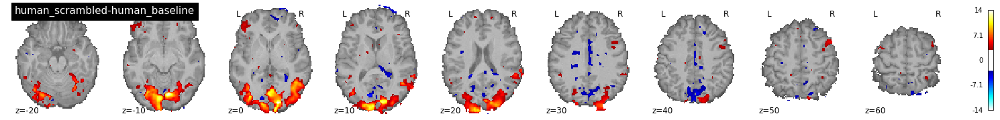

  Contrast  3 out of 4: dog_scrambled-human_scrambled


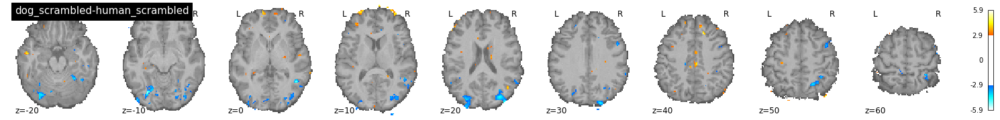

  Contrast  4 out of 4: human_scrambled-dog_scrambled


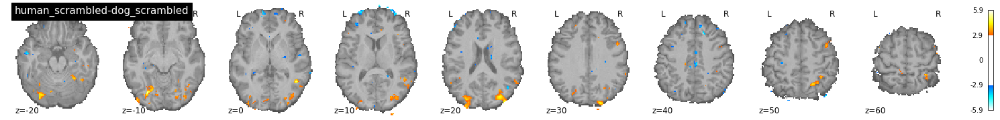

 Working on subject: sub-31
  Contrast  1 out of 4: dog_scrambled-dog_baseline


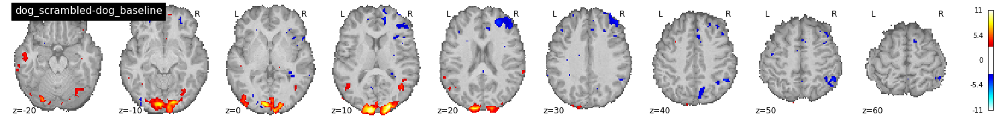

  Contrast  2 out of 4: human_scrambled-human_baseline


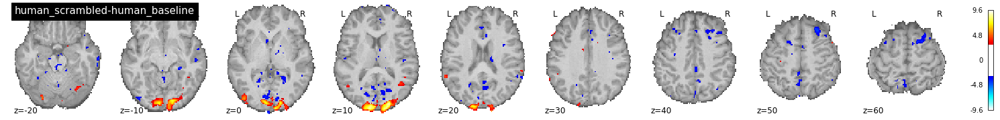

  Contrast  3 out of 4: dog_scrambled-human_scrambled


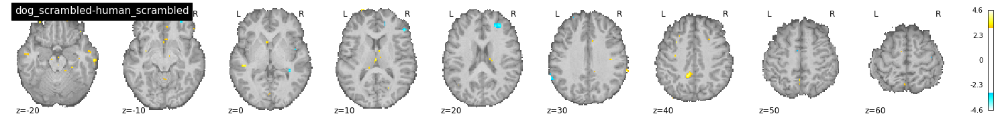

  Contrast  4 out of 4: human_scrambled-dog_scrambled


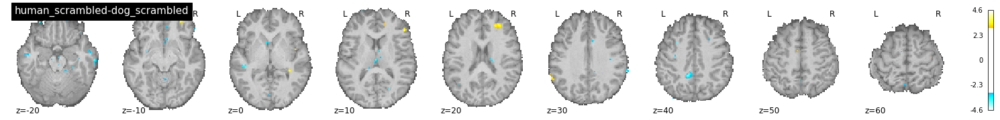

 Working on subject: sub-32
  Contrast  1 out of 4: dog_scrambled-dog_baseline


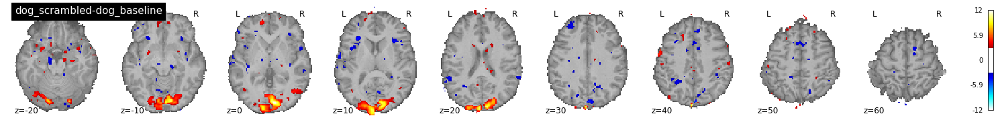

  Contrast  2 out of 4: human_scrambled-human_baseline


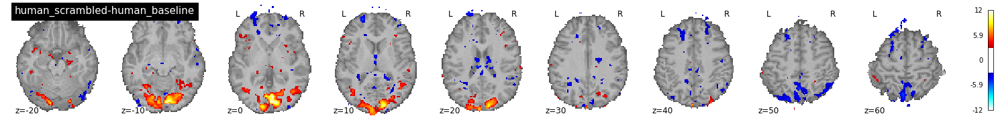

  Contrast  3 out of 4: dog_scrambled-human_scrambled


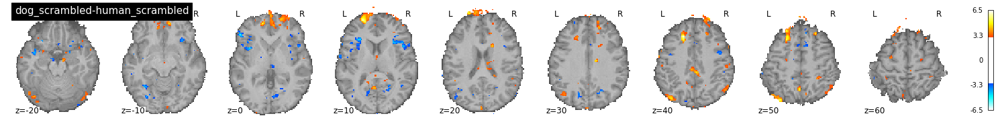

  Contrast  4 out of 4: human_scrambled-dog_scrambled


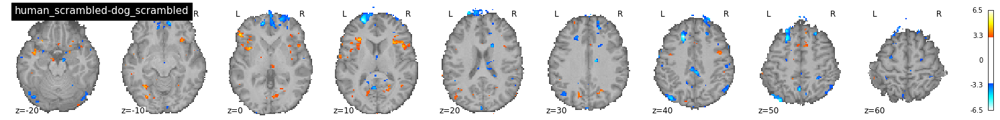

 Working on subject: sub-33
  Contrast  1 out of 4: dog_scrambled-dog_baseline


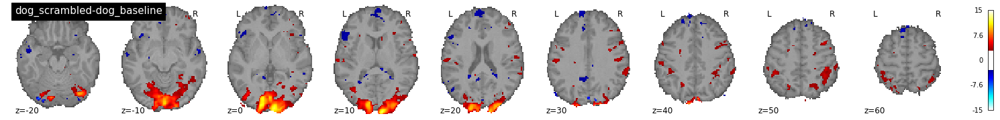

  Contrast  2 out of 4: human_scrambled-human_baseline


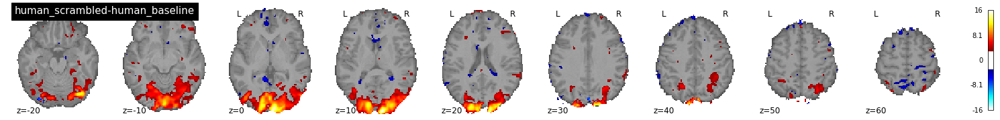

  Contrast  3 out of 4: dog_scrambled-human_scrambled


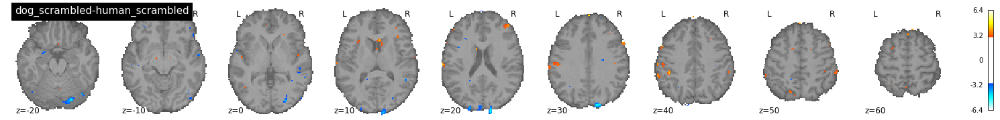

  Contrast  4 out of 4: human_scrambled-dog_scrambled


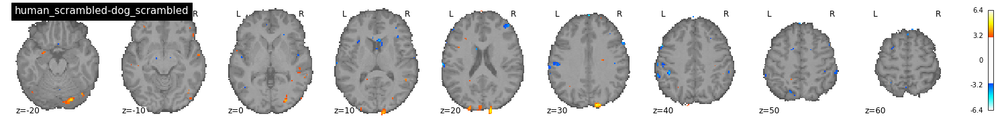

 Working on subject: sub-34
  Contrast  1 out of 4: dog_scrambled-dog_baseline


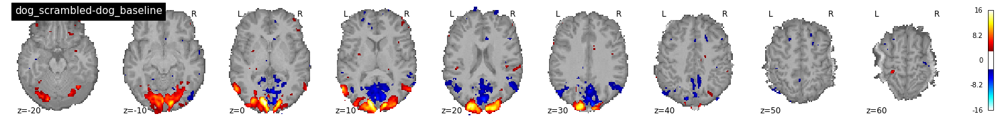

  Contrast  2 out of 4: human_scrambled-human_baseline


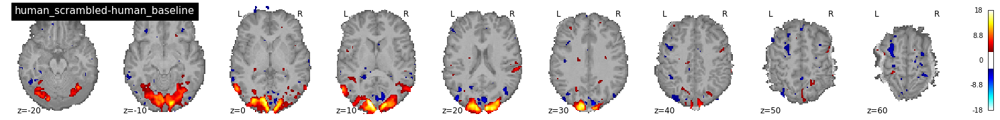

  Contrast  3 out of 4: dog_scrambled-human_scrambled


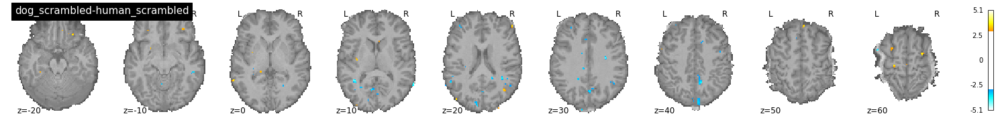

  Contrast  4 out of 4: human_scrambled-dog_scrambled


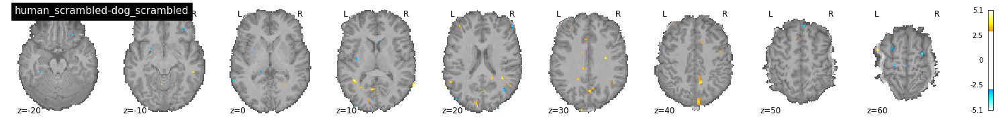

 Working on subject: sub-35
  Contrast  1 out of 4: dog_scrambled-dog_baseline


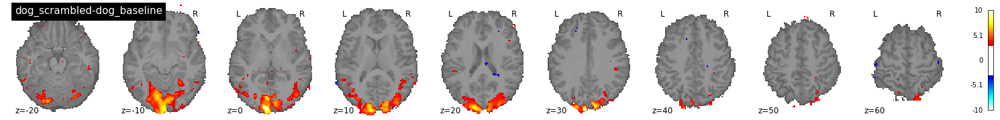

  Contrast  2 out of 4: human_scrambled-human_baseline


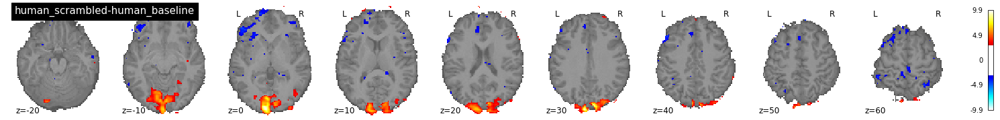

  Contrast  3 out of 4: dog_scrambled-human_scrambled


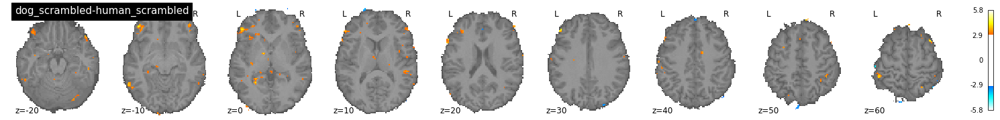

  Contrast  4 out of 4: human_scrambled-dog_scrambled


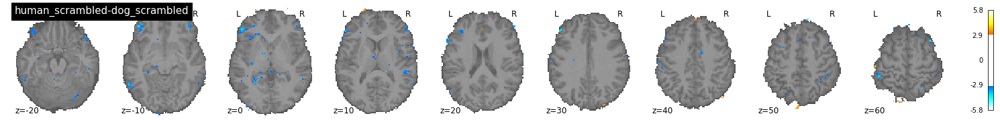

 Working on subject: sub-36
  Contrast  1 out of 4: dog_scrambled-dog_baseline


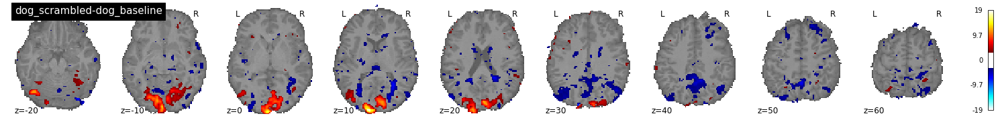

  Contrast  2 out of 4: human_scrambled-human_baseline


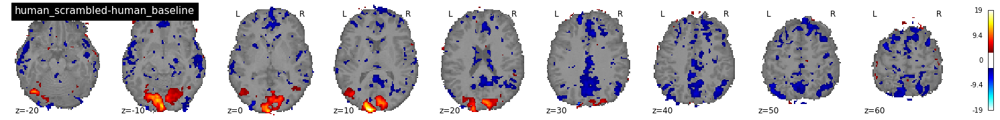

  Contrast  3 out of 4: dog_scrambled-human_scrambled


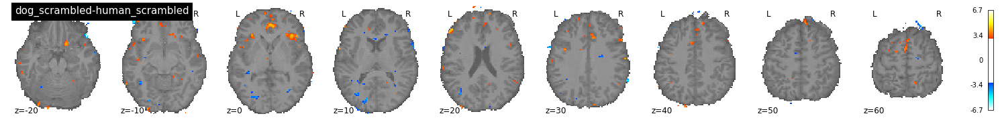

  Contrast  4 out of 4: human_scrambled-dog_scrambled


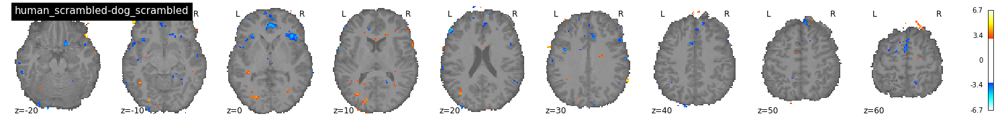

 Working on subject: sub-37
  Contrast  1 out of 4: dog_scrambled-dog_baseline


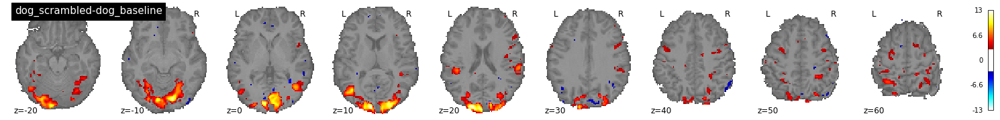

  Contrast  2 out of 4: human_scrambled-human_baseline


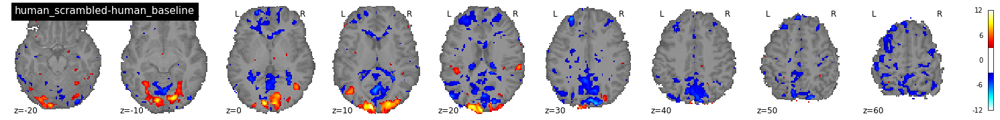

  Contrast  3 out of 4: dog_scrambled-human_scrambled


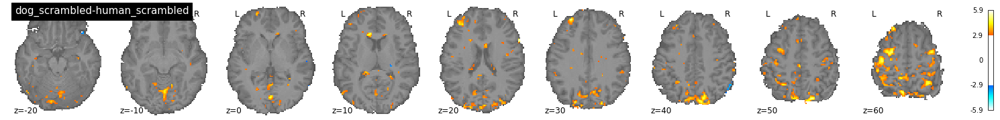

  Contrast  4 out of 4: human_scrambled-dog_scrambled


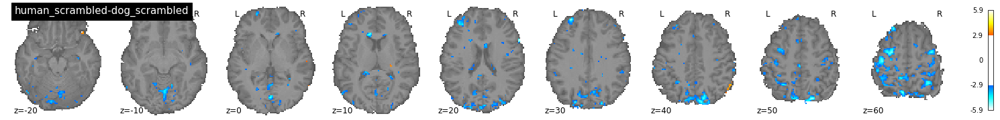

 Working on subject: sub-38
  Contrast  1 out of 4: dog_scrambled-dog_baseline


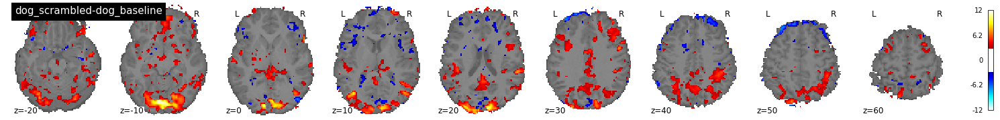

  Contrast  2 out of 4: human_scrambled-human_baseline


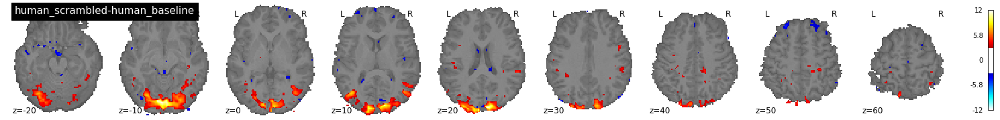

  Contrast  3 out of 4: dog_scrambled-human_scrambled


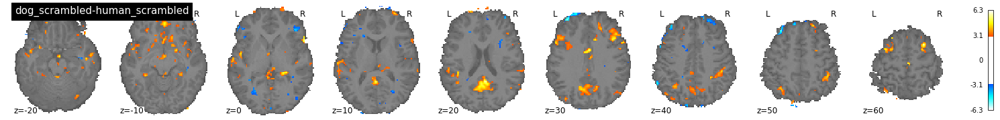

  Contrast  4 out of 4: human_scrambled-dog_scrambled


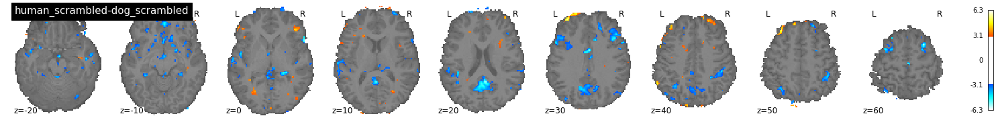

 Working on subject: sub-39
  Contrast  1 out of 4: dog_scrambled-dog_baseline


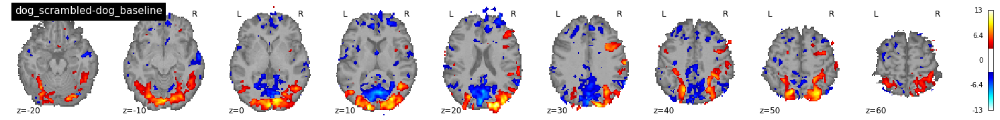

  Contrast  2 out of 4: human_scrambled-human_baseline


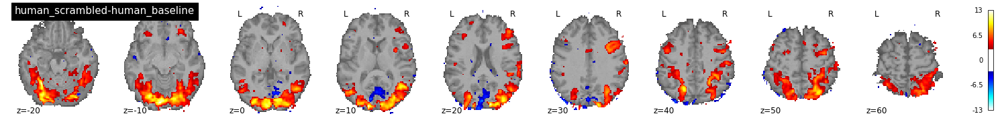

  Contrast  3 out of 4: dog_scrambled-human_scrambled


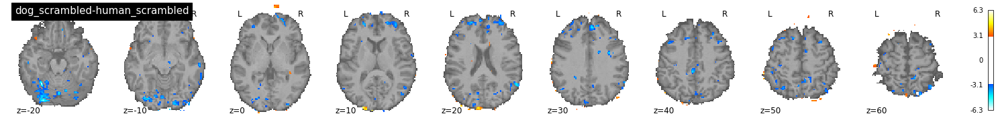

  Contrast  4 out of 4: human_scrambled-dog_scrambled


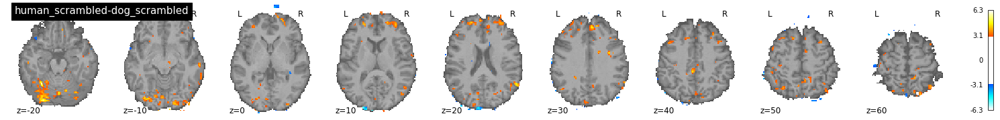

 Working on subject: sub-40
  Contrast  1 out of 4: dog_scrambled-dog_baseline


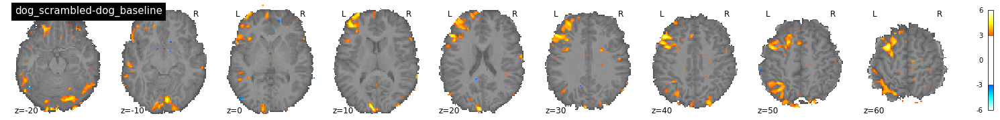

  Contrast  2 out of 4: human_scrambled-human_baseline


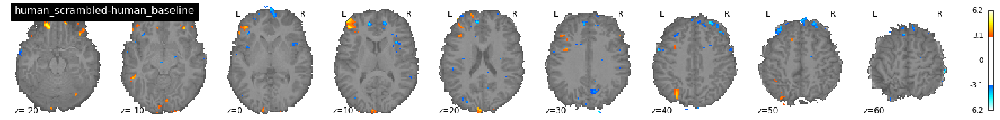

  Contrast  3 out of 4: dog_scrambled-human_scrambled


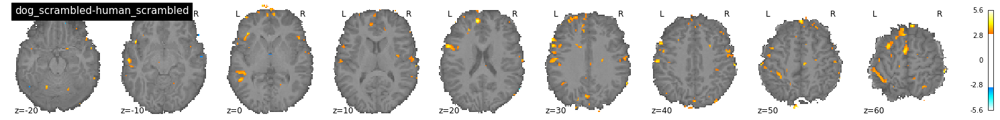

  Contrast  4 out of 4: human_scrambled-dog_scrambled


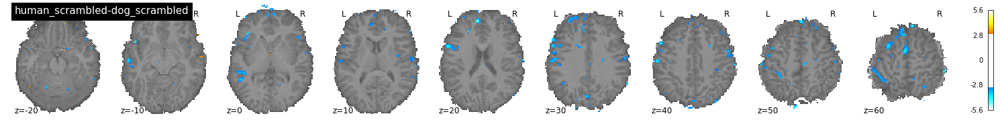

In [21]:
for i, sbj in enumerate(sbj_list):
    print(f' Working on subject: {sbj}')
    for j, (contrast_id, contrast_val) in enumerate(contrasts.items()):
        print('  Contrast % 2i out of %i: %s' % (
            j + 1, len(contrasts), contrast_id))
        # Estimate the contasts. Note that the model implicitly computes a fixed
        # effect across the two sessions
        z_map = aon_flm_dict.get(sbj).compute_contrast(
            contrast_val, output_type='z_score')
        
        # plot the contrasts 
        # the display is overlaid on the warped anatomical
        plotting.plot_stat_map(
            z_map, 
            bg_img=anat_dict.get(sbj), 
            threshold=3.0, 
            display_mode='z',
            cut_coords=range(-20, 70, 10), 
            black_bg=False, 
            title=contrast_id,
            symmetric_cbar=True)
        plotting.show()

        # create a folder to store the output files
        if not os.path.exists(AON_first_level_dir / contrast_id):
            os.makedirs(AON_first_level_dir / contrast_id)
        
        # write the resulting stat images to file
        z_image_path = f"{AON_first_level_dir}/{contrast_id}/{sbj}_{contrast_id}_z_map.nii.gz"
        z_map.to_filename(z_image_path)

### That was it! Now we can use these z-maps for the Second-level-Model!

----------------------